## \#Misinformation: COVID-19 Discourse on Twitter 

### Research Objectives

This research aims to answer the following questions:

    RQ1: Are inorganic accounts engaged in COVID-19 discourse on Twitter?
    RQ2: How do the posts by inorganic accounts differ from organic accounts?
    RQ3: Is there evidence of inorganic accounts making unsubstantiated claims about the pandemic?

In [1]:
import warnings, logging
warnings.filterwarnings('ignore')
warnings.simplefilter("ignore")

import re
import rpy2
import math
import random
import operator
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

%matplotlib inline
from rpy2.robjects import pandas2ri
pandas2ri.activate()
%load_ext rpy2.ipython

pd.set_option('display.float_format', lambda x: '%.4f' % x)
sns.set(rc={'figure.figsize':(20,10)})
sns.set_style(style='white')

np.random.seed(10)

In [2]:
import os

# directory location where .csv files are located
TWEETS_PATH = "/Users/paras/Documents/SMA Research/Sample Tweets"
BOTS_PATH = "/Users/paras/Documents/SMA Research/Bots"

# directory where the output files will be saved
OUTPUT_PATH = "/Users/paras/Documents/SMA Research/Outputs/"

# list of files in directory
TWEETS = [file for file in os.listdir(TWEETS_PATH) if file.endswith(".csv")]

In [3]:
# create dataframe
def create_data_frames(tweets, tweets_path, bots_path):
    """ This function takes in list of TWEETS
    files along with paths where the
    files are located. The function returns a
    dictionary of dataframes
    """
    
    # number of accounts 
    size = 0
    
    # create dictionary of dataframes
    dfs = {}
    
    # find out accounts that no longer exist
    # create a dictionary of dataframes containing
    # accounts that no longer exist (nle) for analysis 
    # if needed
    nle = {}
    
    import vaderSentiment
    from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
    
    # create sentiment analyzer instance
    analyzer = SentimentIntensityAnalyzer()
    
    # iterate over files in TWEETS
    for tweet in tweets:
        
        # find name of the month of tweets
        month = tweet[:-24]
        
        # load TWEET in dataframe
        # some of the columns have mixed types this
        # generates DtypeWarning because pandas has
        # to guess the type of column
        # reference: https://stackoverflow.com/a/27232309
        # usecols is another option
        # reference: https://stackoverflow.com/a/27791362
        # neither of the above approach worked warnings
        # are ignored because of this
        df = pd.read_csv(tweets_path + "/" + tweet)
        # only keep English tweets
        df = df.loc[df.lang == "en"]
        # drop columns that are not needed
        df.drop(columns=["coordinates", "place", "possibly_sensitive", 
                         "source", "user_time_zone", "tweet_url", "user_location", 
                         "user_default_profile_image", "user_name", "user_screen_name", 
                         "user_time_zone"], inplace=True)
        size += len(df)
        
        # load probabilities from bot files
        bot_file_name = tweet.strip(".csv") + "_bots.csv"
        bots = pd.read_csv(bots_path + "/" + bot_file_name)
        
        # there are duplicate accounts in the dataset because an account
        # may tweet more than once, therefore there are duplicate probs
        # only one instance is kept
        bots = bots.drop_duplicates(subset="screen_name", keep="first")
        bots.reset_index(inplace=True, drop=True)
        
        # find accounts that no longer exist
        # these accounts have their user_id marked
        # as NA in bots - probability is still 
        # provided but cannot be verfied
        def find_nle(bots):
            indexes = []
            for idx, row in bots.iterrows():
                if math.isnan(row["user_id"]):
                    indexes.append(idx)
            return indexes
        
        indexes = find_nle(bots)
        nle_accounts = bots.iloc[indexes]
        nle[month] = nle_accounts
                
        # drop accounts that no longer exist from tweet file
        # these accounts have either been suspended or deleted
        # however we cannot assume that they are bots
        df = df[~df["user_screen_name.1"].isin(nle_accounts["screen_name"])]
        bots = bots[~bots["screen_name"].isin(nle_accounts["screen_name"])]
        
        # reset indexes
        df.reset_index(inplace=True, drop=True)
        
        # create probability column, and sentiment column in the dataframe
        def get_prob(x):
            x_dict = bots.loc[bots["screen_name"] == x].to_dict()["prob_bot"]
            [(k, v)] = x_dict.items()
            prob = [(k, v)][0][1]
            return prob
        
        df["prob"] = df["user_screen_name.1"].apply(lambda x: get_prob(x))
        df["sentiment"] = df["text"].apply(lambda x: analyzer.polarity_scores(str(x))["compound"])
        
        def analysis(score):
            if score <= -0.05:
                return 'Negative'
            elif (-0.05 < score < 0.05):
                return 'Neutral'
            else:
                return 'Positive'

        df['analysis'] = df['sentiment'].apply(analysis)
        
        # find out when the accounts were created
        df['year_account_created'] = pd.DatetimeIndex(df['user_created_at']).year
        df['month_account_created'] = pd.DatetimeIndex(df['user_created_at']).month_name()
        
        # find out age of accounts maybe
        # needed later in analysis - if
        # function is run later then the
        # account age will be higher because
        # pd.to_datetime is using todays date
        def age(x):
            days = pd.to_datetime('today').tz_localize("UTC") - pd.to_datetime(x).tz_convert("UTC")
            return abs(days.days)
        
        df['account_age_days'] = df["created_at"].apply(lambda x: age(x))
        
        # find out average tweets per day
        # do bots have more tweets per day
        # than humans?
        def average_tweets_per_day(df):
            df["average_tweets_per_day"] = np.nan
            for idx, row in df.iterrows():
                average_tweets_per_day = 0 if row["account_age_days"] == 0 else row["user_statuses_count"]/row["account_age_days"]
                df.at[idx, "average_tweets_per_day"] = average_tweets_per_day
            return df
        
        df = average_tweets_per_day(df)
        
        df.reset_index(inplace=True, drop=True)
        
        dfs[month] = df
        
    return dfs, nle, size

In [4]:
%%time
dfs, nle, size = create_data_frames(TWEETS, TWEETS_PATH, BOTS_PATH)

CPU times: user 8min, sys: 806 ms, total: 8min 1s
Wall time: 8min 1s


In [5]:
def separate(dfs, month=None, percentages=False, prob=0.5):
    """ This function separates bots and non-bots
    if month is provided then accounts are separated
    by bots and non-bots for the month else the 
    entire dataset is concatenated and accounts are
    separated into two aforementioned categories
    """
    if month:
        df = dfs[month]
    else:
        df = pd.concat([dfs[k] for k,v in dfs.items()])
    
    inorganic = df.loc[(df.prob > prob) & (df["user_verified"] == False)]
    organic = df.loc[df.prob < 0.5]
    
    if percentages:
        if month:
            total_rows = dfs[month].shape[0]
        else:
            frames_list = list(dfs.values())
            total_rows = pd.concat(frames_list, axis=0).shape[0]
        return inorganic, organic, total_rows, round((inorganic.shape[0] / total_rows) * 100, 4)
        
    return inorganic, organic

#### How many inorganic vs organic accounts are in the dataset?

In [6]:
inorganic, organic = separate(dfs)
print(f"Number of Unverified Inorganic Accounts: {len(inorganic)}")
print(f"Number of Organic Accounts: {len(organic)}")
print(f"Total Number of Accounts: {size}")
print(f"Percentage Inorganic Accounts: {(len(inorganic)/size) * 100 :.2f}%")
print(f"Percentage Organic Accounts: {(len(organic)/size) * 100 :.2f}%")

Number of Unverified Inorganic Accounts: 6426
Number of Organic Accounts: 239017
Total Number of Accounts: 287874
Percentage Inorganic Accounts: 2.23%
Percentage Organic Accounts: 83.03%


In [7]:
inorganic["lang"].unique()

array(['en'], dtype=object)

In [8]:
organic["lang"].unique()

array(['en'], dtype=object)

In [9]:
display(Markdown("**INORGANIC DATAFRAME**"))
inorganic.head()

**INORGANIC DATAFRAME**

,created_at,hashtags,media,urls,favorite_count,id,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,lang,...,user_statuses_count,user_urls,user_verified,prob,sentiment,analysis,year_account_created,month_account_created,account_age_days,average_tweets_per_day
24,Fri Jun 05 13:15:21 +0000 2020,coronavirus covid corona decon7 sanitisation l...,https://twitter.com/GermBustersUK/status/12688...,NaN,0,1268894178936840192,NaN,nan,nan,en,...,319.0000,http://www.germbustersuk.com,False,0.6469,0.5106,Positive,2020,May,204,1.5637
43,Fri Jun 19 18:05:13 +0000 2020,Covid_19 ESRD,https://twitter.com/ASPNeph/status/12740405558...,http://ow.ly/vGtP50Ab3Vq,3,1274040555819937793,NaN,nan,nan,en,...,22751.0000,http://www.aspneph.org,False,0.8782,0.0000,Neutral,2013,April,189,120.3757
56,Sun Jun 07 07:02:40 +0000 2020,NaN,https://twitter.com/Irshad27819266/status/1269...,https://ift.tt/2Ulak8V,0,1269525166297669633,NaN,nan,nan,en,...,1354.0000,NaN,False,0.9566,-0.3818,Negative,2020,April,202,6.7030
93,Tue Jun 30 18:12:08 +0000 2020,vt vtpoli,NaN,https://bit.ly/3ihLTn6,0,1278028563153895426,NaN,nan,nan,en,...,4642.0000,NaN,False,0.7850,-0.3400,Negative,2010,January,178,26.0787
170,Mon Jun 29 13:38:45 +0000 2020,Gilead CORONAVIRUS Remdesivir US PATiENTS,NaN,https://www.cnbc.com/2020/06/29/gileads-corona...,0,1277597373280202753,NaN,nan,nan,en,...,509755.0000,NaN,False,0.9967,0.0000,Neutral,2020,May,180,2831.9722


In [10]:
display(Markdown("**ORGANIC DATAFRAME**"))
organic.head()

**ORGANIC DATAFRAME**

,created_at,hashtags,media,urls,favorite_count,id,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,lang,...,user_statuses_count,user_urls,user_verified,prob,sentiment,analysis,year_account_created,month_account_created,account_age_days,average_tweets_per_day
0,Fri Jun 19 16:45:49 +0000 2020,NaN,NaN,NaN,1,1274020574168309760,realDonaldTrump,1273980887735173120.0000,25073877.0000,en,...,28411.0000,NaN,False,0.0029,-0.8126,Negative,2015,April,190,149.5316
1,Wed Jun 10 23:15:13 +0000 2020,NaN,NaN,NaN,0,1270857079016882181,NaN,nan,nan,en,...,4216.0000,NaN,False,0.0005,0.0000,Neutral,2012,September,198,21.2929
2,Mon Jun 22 20:03:53 +0000 2020,BTS,NaN,NaN,0,1275157583817576455,NaN,nan,nan,en,...,99991.0000,https://www.bts-be.com/,False,0.0115,0.0000,Neutral,2015,August,186,537.5860
3,Sun Jun 07 23:24:48 +0000 2020,NaN,NaN,NaN,0,1269772324951093251,NaN,nan,nan,en,...,17203.0000,NaN,False,0.0013,0.3182,Positive,2014,May,201,85.5871
4,Fri Jun 12 12:18:11 +0000 2020,NaN,NaN,NaN,0,1271416508120469505,NaN,nan,nan,en,...,38076.0000,NaN,False,0.0024,-0.7506,Negative,2013,March,197,193.2792


#### What does the inorganic account activity looks like by months?

In [11]:
# find out bot activity by month
def activity(dfs):
    chart = {"months": [], "inorganic_per": [], "organic_per": [], "num_inorganic": [], "num_organic": [], "total": []}
    for key, val in dfs.items():
        bots, non_bots, total_rows, percent = separate(dfs, month=key, percentages=True)
        chart["months"].append(key)
        chart["inorganic_per"].append(percent)
        chart["organic_per"].append(100-percent)
        chart["num_inorganic"].append(len(bots))
        chart["num_organic"].append(len(non_bots))
        chart["total"].append(total_rows)
        
    chart = pd.DataFrame(chart)
    chart.to_csv(OUTPUT_PATH + "bot_activity_by_month.csv")
    chart["months"] = pd.Categorical(chart['months'], ['January', 'February', 'March', 'April', 
                                                       'May', 'June', 'July', 'August', 'September', 
                                                       'October', 'November'])
    chart = chart.sort_values("months")
    chart.reset_index(inplace=True, drop=True)
    return chart

In [12]:
chart = activity(dfs)

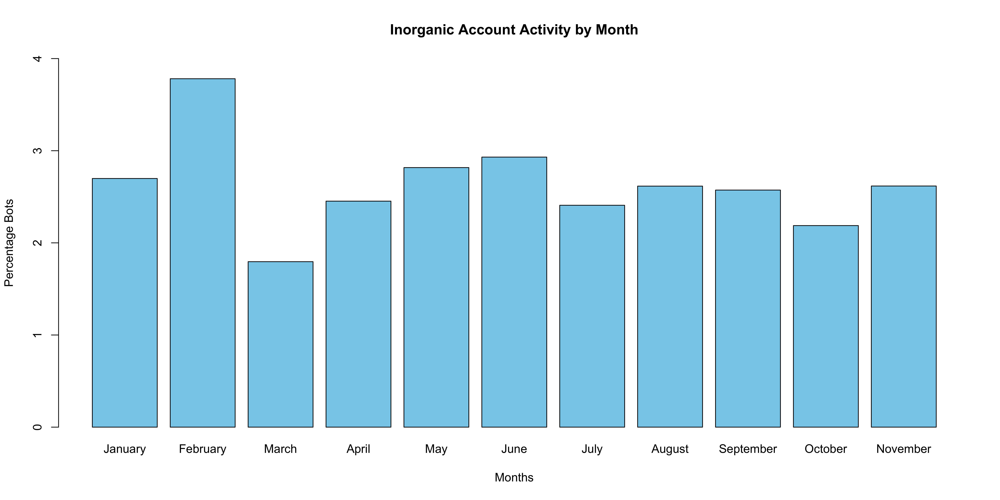

In [13]:
%%R -i chart -w 14 -h 7 --units in -r 500
data <- data.frame(chart)
barplot(height=data$inorganic_per, names=data$months, main="Inorganic Account Activity by Month", 
        xlab = "Months", ylab="Percentage Bots", 
        ylim=range(pretty(c(0, data$inorganic_per))), col="skyblue")

#### What is the account creation year for the inorganic accounts?

In [14]:
# find out when inorganic accounts were created
def inorganic_account_creation_years(dfs):
    # create dictionary of years
    years = {}
    
    df = pd.concat(list(dfs.values()), axis=0)
    # find inorganic accounts - filter out verified accounts 
    inorganic = df.loc[(df.prob > 0.5) & (df["user_verified"] == False)]
    # iterate over year account created list and count occurrences
    for year in list(inorganic["year_account_created"]):
        years[year] = [list(inorganic["year_account_created"]).count(year)]
        
    # create dataframe from years dictionary
    years = pd.DataFrame(years)
    # transpose the dataframe because in its current
    # iteration it is displayed horizontally
    years = years.transpose()
    # create an index column because years are being
    # treated as index currently
    years["index"] = range(0, len(years))
    # set index column to index of the dataframe
    years['index'] = years.index
    
    # name the columns - count represents number
    # of accounts created in a particular year
    # year represents year
    years.columns = ["count", "year"]
    years.reset_index(drop=True, inplace=True)
    
    # calculate percentage of accounts created in a year
    # out of the total number of accounts created
    years["percentage"] = years["count"].apply(lambda x: (x/years["count"].sum()) * 100)

    # create a csv for later usage if needed
    years.to_csv(OUTPUT_PATH + "inorganic_account_creation_years.csv")
    years.sort_values(by=["year"], ascending=True, inplace=True)
    years["rate"] = years["count"].pct_change()
    
    return years

In [15]:
years = inorganic_account_creation_years(dfs)
years

,count,year,percentage,rate
12,43,2007,0.6692,nan
10,134,2008,2.0853,2.1163
11,557,2009,8.6679,3.1567
2,425,2010,6.6138,-0.2370
5,415,2011,6.4581,-0.0235
9,317,2012,4.9331,-0.2361
1,339,2013,5.2754,0.0694
13,317,2014,4.9331,-0.0649
4,494,2015,7.6875,0.5584
8,521,2016,8.1077,0.0547


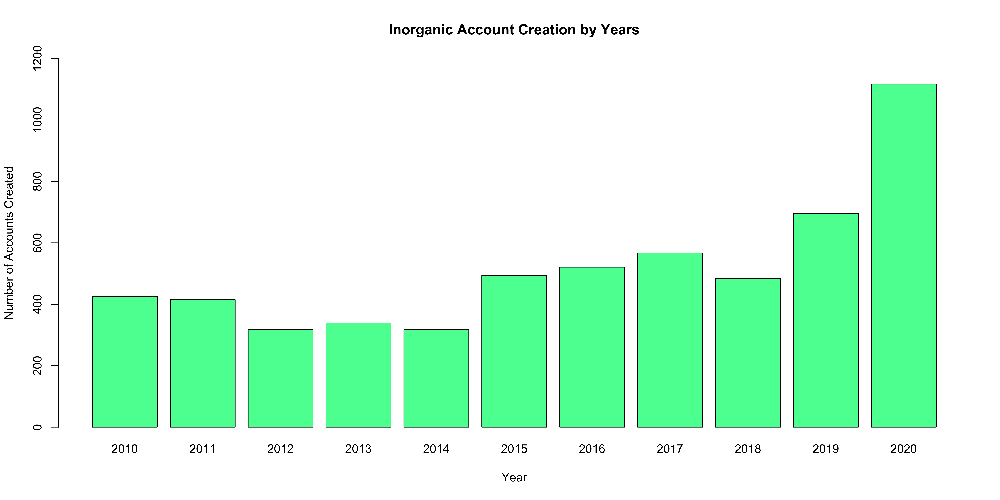

In [16]:
%%R -i years -w 14 -h 7 --units in -r 500
data <- data.frame(years)
data <- data[4:14, ]
barplot(height=data$count, names=data$year, main="Inorganic Account Creation by Years", 
        xlab = "Year", ylab="Number of Accounts Created", 
        ylim=range(pretty(c(0, data$count))), col="seagreen1")

In [17]:
def inorganic_account_creation_months_by_year(dfs, year, inorganic_accounts=True):
    inorganic, organic = separate(dfs)
    
    if inorganic_accounts:
        months_list = list(inorganic.loc[inorganic["year_account_created"] == year]["month_account_created"].values)
    else:
        months_list = list(organic.loc[organic["year_account_created"] == year]["month_account_created"].values)
        
    # create dictionary of months
    months = {}
    
    # iterate over months account created list and count occurrences
    for month in months_list:
        months[month] = months_list.count(month)
        
    # create dataframe from months dictionary
    months = pd.DataFrame(months, index=[0])
    # transpose the dataframe because in its current
    # iteration it is displayed horizontally
    months = months.transpose()
    # create an index column because months are being
    # treated as index currently
    months["index"] = range(0, len(months))
    # set index column to index of the dataframe
    months['index'] = months.index
    
    # name the columns - count represents number
    # of accounts created in a particular months
    # months represents months
    months.columns = ["count", "months"]
    months.reset_index(drop=True, inplace=True)
    
    # calculate percentage of accounts created in a month
    # out of the total number of accounts created
    months["percentage"] = months["count"].apply(lambda x: (x/months["count"].sum()) * 100)
    
    months["months"] = pd.Categorical(months['months'], ['January', 'February', 'March', 'April', 
                                                       'May', 'June', 'July', 'August', 'September', 
                                                       'October', 'November', 'December'])
    
    # create a csv for later usage if needed
    months.to_csv(OUTPUT_PATH + "inorganic_account_creation_months_by_year.csv")
    months.sort_values(by=["months"], ascending=True, inplace=True)
    months.reset_index(drop=True, inplace=True)
    months["rate"] = months["count"].pct_change()
    
    return months

In [18]:
months = inorganic_account_creation_months_by_year(dfs, 2015)
months

,count,months,percentage,rate
0,40,January,8.0972,nan
1,46,February,9.3117,0.1500
2,51,March,10.3239,0.1087
3,44,April,8.9069,-0.1373
4,31,May,6.2753,-0.2955
5,68,June,13.7652,1.1935
6,30,July,6.0729,-0.5588
7,36,August,7.2874,0.2000
8,43,September,8.7045,0.1944
9,34,October,6.8826,-0.2093


DT announced his presidency in June of 2015, highest number of bots created in the year - also see a rise in bots after 2014 up until 2017.

#### What domains were shared by inorganic accounts vs organic accounts?

In [19]:
import tldextract

In [20]:
def shared_domains(dfs, url_type="urls"):
    # divide the dataframe by inorganic and organic
    inorganic, organic = separate(dfs)
    
    # find out urls shared
    inorganic_urls = inorganic[inorganic[url_type].notnull()][url_type].values
    organic_urls = organic[organic[url_type].notnull()][url_type].values
    
    # create a list of domains
    inorganic_domains = []
    
    # for each url in inorganic urls
    # extract the domain and put it in
    # the inorganic_domains list
    for url in inorganic_urls:
        domain = tldextract.extract(url).domain
        if domain == "youtu":
            domain = "youtube"
        if domain == "goo":
            domain = "google"
        inorganic_domains.append(domain.lower())
    
    # do same as above for organic urls
    organic_domains = []
    
    for url in organic_urls:
        domain = tldextract.extract(url).domain
        if domain == "youtu":
            domain = "youtube"
        if domain == "goo":
            domain = "google"
        organic_domains.append(domain.lower())
    
    return inorganic_domains, organic_domains, inorganic, organic

In [21]:
def count_domains(domains):
    
    # create a dictionary to keep track
    # of domain and how many times the
    # domain appears
    count = {}
    for domain in domains:
        number = domains.count(domain)
        if domain not in count:
            count[domain] = number
        else:
            count[domain] += 1
    return count

def common_domains(domains, morethan):
    
    # create a dictionary of common 
    # domains - if domain appears more
    # than a certain number of times
    # place it in common dictionary
    # otherwise increment other domain
    # by 1
    common = {"other": 0}
    for domain in domains:
        if domains[domain] > morethan:
            common[domain] = domains[domain]
        else:
            common["other"] += 1
    return common

In [22]:
def domains_info(dfs, morethan, use_organic=False, url_type="urls"):
    
    inorganic_domains, organic_domains, inorganic, organic = shared_domains(dfs, url_type)

    if use_organic:
        shared = organic_domains
    else:
        shared = inorganic_domains
    
    domain = count_domains(shared)
    domain = common_domains(domain, morethan)
    domain_frame = pd.DataFrame(domain, index=[0])
    
    domain_frame = domain_frame.transpose()
    domain_frame['index'] = range(0, len(domain_frame))
    domain_frame['index'] = domain_frame.index
    
    domain_frame.columns = ["shared", "domain"]
    domain_frame.reset_index(drop=True, inplace=True)
    other = domain_frame.loc[domain_frame["domain"] == "other"]
    
    rest = domain_frame.drop(index=0)
    rest.sort_values(by=["shared"], ascending=False, inplace=True)
    
    if use_organic:
        rest["percentage"] = rest["shared"].apply(lambda x: ((x/len(organic)) * 100 ))
        rest.to_csv(OUTPUT_PATH + "common_domains_organic.csv")
    else:
        rest["percentage"] = rest["shared"].apply(lambda x: ((x/len(inorganic)) * 100 ))
        rest.to_csv(OUTPUT_PATH + "common_domains_inorganic.csv")
        
    return rest

#### Tweet Urls

In [23]:
%%time
inorganic_domains = domains_info(dfs, 10, use_organic=False)
organic_domains = domains_info(dfs, 10, use_organic=True)

CPU times: user 25.2 s, sys: 44 ms, total: 25.2 s
Wall time: 25.2 s


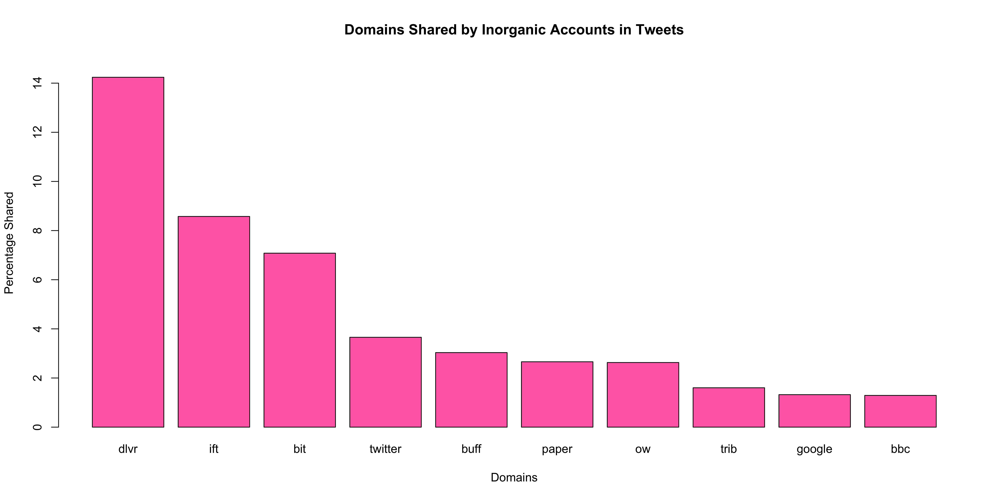

In [24]:
%%R -i inorganic_domains -w 14 -h 7 --units in -r 500
data <- data.frame(inorganic_domains)
data <- data[1:10, ]
barplot(height=data$percentage, names=data$domain, main="Domains Shared by Inorganic Accounts in Tweets", 
        xlab = "Domains", ylab="Percentage Shared", 
        ylim=range(pretty(c(0, data$percentage))), col="hotpink1")

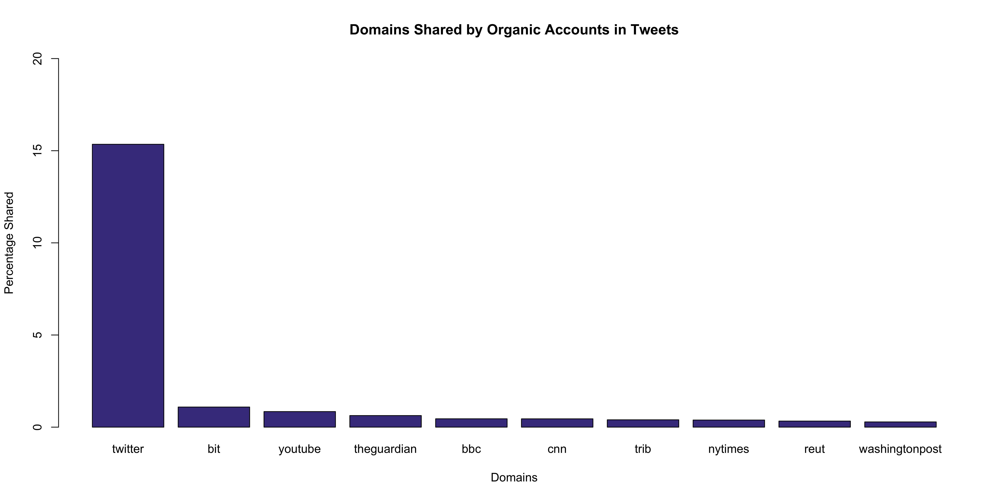

In [25]:
%%R -i organic_domains -w 14 -h 7 --units in -r 500
data <- data.frame(organic_domains)
data <- data[1:10, ]
barplot(height=data$percentage, names=data$domain, main="Domains Shared by Organic Accounts in Tweets", 
        xlab = "Domains", ylab="Percentage Shared", 
        ylim=range(pretty(c(0, data$percentage))), col="darkslateblue")

#### User Urls

In [26]:
%%time
inorganic_domains = domains_info(dfs, 10, use_organic=False, url_type="user_urls")
organic_domains = domains_info(dfs, 10, use_organic=True, url_type="user_urls")

CPU times: user 34.8 s, sys: 41.7 ms, total: 34.8 s
Wall time: 34.8 s


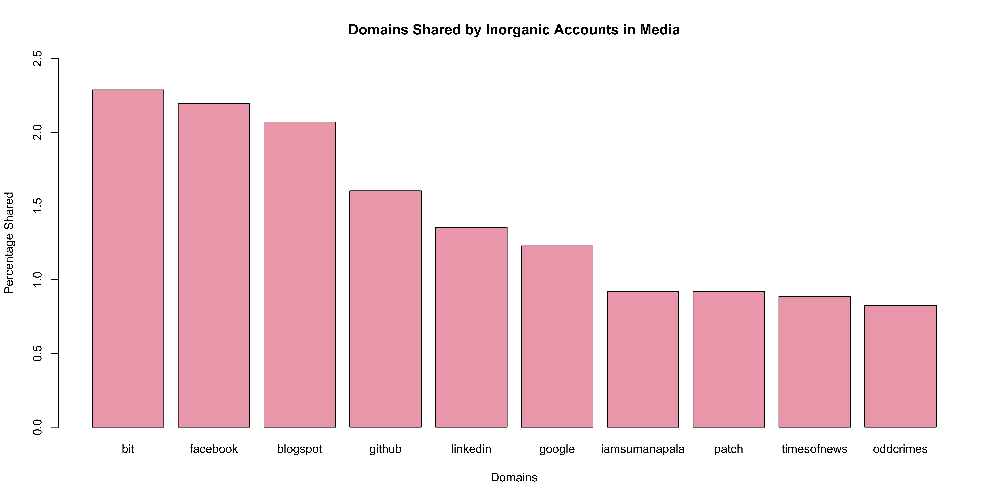

In [27]:
%%R -i inorganic_domains -w 14 -h 7 --units in -r 500
data <- data.frame(inorganic_domains)
data <- data[1:10, ]
barplot(height=data$percentage, names=data$domain, main="Domains Shared by Inorganic Accounts in Media", 
        xlab = "Domains", ylab="Percentage Shared", 
        ylim=range(pretty(c(0, data$percentage))), col="pink2")

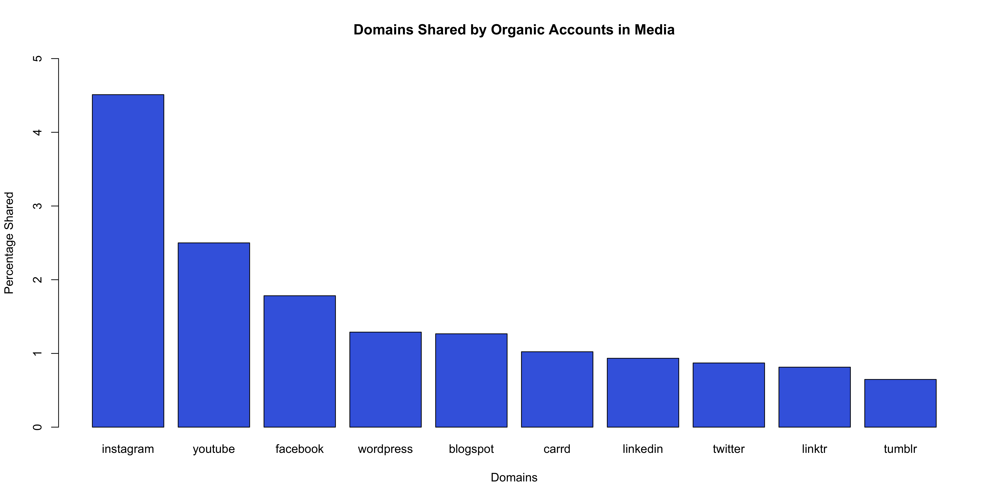

In [28]:
%%R -i organic_domains -w 14 -h 7 --units in -r 500
data <- data.frame(organic_domains)
data <- data[1:10, ]
barplot(height=data$percentage, names=data$domain, main="Domains Shared by Organic Accounts in Media", 
        xlab = "Domains", ylab="Percentage Shared", 
        ylim=range(pretty(c(0, data$percentage))), col="royalblue")

#### What percentage of inorganic accounts share a link as compared to organic accounts?

In [29]:
inorganic, organic = separate(dfs)
    
inorganic_urls = inorganic[inorganic["urls"].notnull()]["urls"].values
organic_urls = organic[organic["urls"].notnull()]["urls"].values

print(f"Percentage of Inorganic Account That Shared a Link: {(len(inorganic_urls)/len(inorganic)) * 100 :.2f}%")
print(f"Percentage of Organic Account That Shared a Link: {(len(organic_urls)/len(organic)) * 100 :.2f}%")

Percentage of Inorganic Account That Shared a Link: 73.62%
Percentage of Organic Account That Shared a Link: 18.51%


In [30]:
dfs["January"].columns

Index(['created_at', 'hashtags', 'media', 'urls', 'favorite_count', 'id',
       'in_reply_to_screen_name', 'in_reply_to_status_id',
       'in_reply_to_user_id', 'lang', 'retweet_count', 'retweet_id',
       'retweet_screen_name', 'text', 'user_created_at', 'user_description',
       'user_favourites_count', 'user_followers_count', 'user_friends_count',
       'user_listed_count', 'user_screen_name.1', 'user_statuses_count',
       'user_urls', 'user_verified', 'prob', 'sentiment', 'analysis',
       'year_account_created', 'month_account_created', 'account_age_days',
       'average_tweets_per_day'],
      dtype='object')

#### Retweets

In [31]:
def percent_retweeted(dfs):
    inorganic, organic = separate(dfs)
    
    inorganic = list(inorganic["text"])
    organic = list(organic["text"])
    
    inorganic_retweet_count = 0
    for tweet in inorganic:
        if tweet.startswith("RT"):
            inorganic_retweet_count += 1
    
    inorganic_retweet_percentage = inorganic_retweet_count / len(inorganic)
    
    organic_retweet_count = 0
    for tweet in organic:
        if tweet.startswith("RT"):
            organic_retweet_count += 1
            
    organic_retweet_percentage = organic_retweet_count / len(organic)
    
    return inorganic_retweet_percentage, organic_retweet_percentage

In [32]:
percent_retweeted(dfs)

(0.2530345471521942, 0.7603308551274596)

Organic accounts retweet more often.

In [33]:
def organic_account_retweets(dfs):
    
    inorganic, organic = separate(dfs)
    
    import csv
    
    with open(OUTPUT_PATH + "inorganic_retweet_username.csv", "w", newline="") as outcsv:
        written = []
        writer = csv.writer(outcsv)
        writer.writerow(["screen_name"])
        tweets = list(inorganic["text"].values)
        for tweet in tweets:
            if tweet.startswith("RT"):
                username = re.findall(r"(?<=@)\w+", tweet)
                if len(username) >= 1:
                    username = username[0]
                    if username not in written:
                        writer.writerow([username])
                        written.append(username)
                        
    with open(OUTPUT_PATH + "organic_retweet_username.csv", "w", newline="") as outcsv:
        written = []
        writer = csv.writer(outcsv)
        writer.writerow(["screen_name"])
        tweets = list(organic["text"].values)
        for tweet in tweets:
            if tweet.startswith("RT"):
                username = re.findall(r"(?<=@)\w+", tweet)
                if len(username) >= 1:
                    username = username[0]
                    if username not in written:
                        writer.writerow([username])
                        written.append(username)

Note: use the organic_retweet_username.csv file to find out inorganic probabilities, and check if there are any bots P(B) > 0.5.

In [34]:
%%time
organic_account_retweets(dfs)

CPU times: user 35.8 s, sys: 31.1 ms, total: 35.8 s
Wall time: 35.8 s


In [35]:
%%R -i years -w 14 -h 7 --units in -r 500

# remotes::install_github("mkearney/tweetbotornot2")
suppressMessages(library(tweetbotornot2))
suppressMessages(library(rtweet))
suppressMessages(library(twitteR))
suppressMessages(library(rjson))
suppressMessages(library(curl))
suppressMessages(library(dplyr))

# Keys provided by JHU
consumer_key = 'RqP0xJuY2XKfZfU68vbZfsiRi'
consumer_secret = 'WyQ7uoEIfRN4hRXHNXxcum6xhx8Jo7Dcjxa8qR073W9Cuc7pjm'
access_token = '851046331-cFjDnAWsZtz3azNQ75DleWXJuHZPtZ9DhzxlJDbK'
access_secret = '9L7FlR0yb5UxBbCKgqQbAsMTKAg1N3FhcgjO0hDbBAgta'

# Create token
rtweet::create_token(consumer_key = consumer_key, 
                     consumer_secret = consumer_secret, 
                     access_token = access_token, 
                     access_secret = access_secret)

# find out probability of an individual account
predict_bot("o_newsroom")

[17:17:22] WARNING: amalgamation/../src/learner.cc:764: Loading model from XGBoost < 1.0.0, consider saving it again for improved compatibility
    user_id screen_name  prob_bot
1 495061709  o_newsroom 0.9994547


In [36]:
inorganic, organic = separate(dfs)

In [37]:
inorganic["analysis"].value_counts()

Neutral     2333
Positive    2136
Negative    1957
Name: analysis, dtype: int64

In [38]:
organic["analysis"].value_counts()

Negative    88984
Positive    85489
Neutral     64544
Name: analysis, dtype: int64

In [39]:
print(f"Average Sentiment of Inorganic Accounts: {inorganic.sentiment.mean() :.2f}")
print(f"Average Sentiment of Organic Accounts: {organic.sentiment.mean() :.2f}")

Average Sentiment of Inorganic Accounts: 0.02
Average Sentiment of Organic Accounts: -0.01


#### Topic Modeling

In [40]:
inorganic, organic = separate(dfs)

In [41]:
display(Markdown("**INORGANIC TWEETS**"))
list(inorganic["text"].values)[:10]

**INORGANIC TWEETS**

['COVID-secure with deep cleaning and non-toxic decontamination✔️\n\n📞 Contact us today for free advice\nm: 07889 015502\nm: 07817 753514\nt:   01342 312 468\ne:  germbustersuk@gmail.com\n\n#coronavirus #covid #corona #decon7 #sanitisation\n#lockdown #staysafe #virus #covid-19 #staywell https://t.co/lq0i8Wr8pS',
 'Steroids: a therapeutic option for COVID-19 pneumonia patients with end-stage renal disease? https://t.co/XQOUejCWEG @KIReports #Covid_19 #ESRD https://t.co/PM3gmcLnsR',
 'Coronavirus: How map hacks and buttocks helped Taiwan fight Covid-19 https://t.co/A5u7piDO3R Facebookpages, IFTTT https://t.co/wiTKwqTMyP',
 'Recent coronavirus data suggest lockdowns were a colossal mistake.\nMargolis➛https://t.co/psepzGKYLp #vt  #vtpoli\n➢➢➢➢➢➢➢➢➢➢➢➢➢➢➢',
 "RT @chidambara09: #Gilead's #CORONAVIRUS treatment #Remdesivir to cost $3,120 for #US insured #PATiENTS https://t.co/LhCoUWyOKC\n\nby\n@WillFO…",
 'Assam To Set Up Special Coronavirus Research Lab As Cases Cross\xa05,000 https://t.co/5

In [42]:
display(Markdown("**ORGANIC TWEETS**"))
list(organic["text"].values)[:10]

**ORGANIC TWEETS**

["@realDonaldTrump There won't be a single inbred hillbilly there who isn't already going to vote for you. You're exposing them to the Coronavirus for no other reason than to boost your own deservedly fragile ego. You're a loser, Donald. A real loser.",
 "RT @SkyNews: BREAKING: Professor Neil Ferguson, one of the government's former key advisers, says if the UK entered lockdown a week earlier…",
 'RT @BTSPublicity: .@BTS_twt donated $1.000.000 to Live Nation\'s Crew Nation Campaign.\n\n#BTS: "We are aware that a lot of communities need h…',
 'RT @sleepyflow3r: Please continue to wear a mask, disinfect, and wash your hands. The second wave of covid is already in some states. Just…',
 'RT @JoeNBC: TRUMP: Come to Our Rally. \nPS. It could kill you, but that’s your problem. \n\n“By clicking register below, you are acknowledging…',
 'RT @NorbertElekes: NEW: India has conducted over 200,000 coronavirus tests in a single day for the first time since the outbreak began.',
 'RT @collegeboreal: 

In [43]:
def preprocess_tweet(tweet):
    tweet = tweet.strip("RT")
    
    def clean(tweet):
        words = tweet.split()
        tweet = ""
        for word in words:
            if not "@" in word:
                if not ":" in word:
                    tweet += " " + word
        return tweet
    
    tweet = clean(tweet)
        
    tweet = re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)", "", tweet, flags=re.MULTILINE)
    tweet = re.sub(r"https?:\/\/(www\.)?[-a-zA-Z0–9@:%._\+~#=]{2,256}\.[a-z]{2,6}\b([-a-zA-Z0–9@:%_\+.~#?&//=]*)", "", tweet, flags=re.MULTILINE)
    tweet = re.sub(r"[-a-zA-Z0–9@:%._\+~#=]{2,256}\.[a-z]{2,6}\b([-a-zA-Z0–9@:%_\+.~#?&//=]*)", "", tweet, flags=re.MULTILINE)
    tweet = " ".join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", "", tweet).split())
    tweet = re.sub(r"\d", "", tweet)
    return tweet

In [44]:
%%time
inorganic["tweet_text"] = inorganic["text"].apply(lambda x: preprocess_tweet(x))
organic["tweet_text"] = organic["text"].apply(lambda x: preprocess_tweet(x))

CPU times: user 7.73 s, sys: 5.66 ms, total: 7.73 s
Wall time: 7.73 s


In [45]:
display(Markdown("**INORGANIC TWEETS PROCESSED**"))
list(inorganic["tweet_text"].values)[:10]

**INORGANIC TWEETS PROCESSED**

['COVIDsecure with deep cleaning and nontoxic decontamination Contact us today for free advice        coronavirus covid corona decon sanitisation lockdown staysafe virus covid staywell',
 'a therapeutic option for COVID pneumonia patients with endstage renal disease Covid ESRD',
 'How map hacks and buttocks helped Taiwan fight Covid Facebookpages IFTTT',
 'ecent coronavirus data suggest lockdowns were a colossal mistake vt vtpoli',
 'Gileads CORONAVIRUS treatment Remdesivir to cost  for US insured PATiENTS by',
 'Assam To Set Up Special Coronavirus Research Lab As Cases Cross ',
 'If you are serious about saving Texans let us vote by mail in November Its just the right thing to do',
 'Nurse shows up in Bikini to treat Covid Patients in Russia',
 'i had a dream that i tested positive for corona',
 'Leicester faces extra twoweek lockdown with pubs and hairdressers staying SHUT']

In [46]:
display(Markdown("**ORGANIC TWEETS PROCESSED**"))
list(organic["tweet_text"].values)[:10]

**ORGANIC TWEETS PROCESSED**

['There wont be a single inbred hillbilly there who isnt already going to vote for you Youre exposing them to the Coronavirus for no other reason than to boost your own deservedly fragile ego Youre a loser Donald A real loser',
 'Professor Neil Ferguson one of the governments former key advisers says if the UK entered lockdown a week earlier',
 'donated  to Live Nations Crew Nation Campaign We are aware that a lot of communities need h',
 'Please continue to wear a mask disinfect and wash your hands The second wave of covid is already in some states Just',
 'Come to Our Rally PS It could kill you but thats your problem By clicking register below you are acknowledging',
 'India has conducted over  coronavirus tests in a single day for the first time since the outbreak began',
 'With the increasing demand for locallysourced food products since the beginning of the COVID pandemic Collge Bora',
 'Florida is becoming one of the biggest hot spots for Covid big surprise with the people we hav

In [47]:
from nltk.corpus import stopwords
from nltk.tokenize import wordpunct_tokenize
from gensim import corpora, models, similarities
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel, LdaModel
import pyLDAvis.gensim
warnings.filterwarnings("ignore", category=DeprecationWarning) 

def lda_modeling(tweets, num=100):
    
    tweets = tweets[:num]
    
    random.shuffle(tweets)
    
    stop_words = set(stopwords.words('english'))
    stop_words.update(['.',  ',', '"', "'", '?', '!', ':', ';', '(', ')', '[', ']', '{', '}','year', 'the', 'via', 'amp'])
        
    words = []
    for tweet in tweets:
        tweet = tweet.lower()
        tokenized = wordpunct_tokenize(tweet)
        for token in tokenized:
            if token not in stop_words:
                words.append(token.lower())

    all_tokens = ' '.join(words)

    texts = words
    tokens_once = set(words for words in set(all_tokens) if all_tokens.count(words) == 1)
    texts = [[words for words in texts if words not in tokens_once] for words in all_tokens]
        
    dictionary = Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]

    lda = LdaModel(corpus=corpus, id2word=dictionary, num_topics=10, random_state=10)
    
    return lda, corpus, dictionary

In [48]:
inorganic_tweets = list(inorganic["tweet_text"].values)
organic_tweets = list(organic["tweet_text"].values)

***

LDA Modeling code takes a long time to return results. With 500 tweets runtime is approximately 11 minutes. In another experiment 1000 tweets took 1 hour and 49 minutes to return results for each of the dataframes! Several efforts to optimize the code show that the backlog is certainly due to the following code:

    texts = words
    tokens_once = set(words for words in set(all_tokens) if all_tokens.count(words) == 1)
    texts = [[words for words in texts if words not in tokens_once] for words in all_tokens]

Definitely would be interesting to see what modeling looks like with all the tweets analyzed.
***

In [49]:
%%time
lda, corpus, dictionary = lda_modeling(inorganic_tweets, num=500)
topic_vis = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
display(Markdown("**INORGANIC TOPIC MODELING**"))
pyLDAvis.display(topic_vis)

**INORGANIC TOPIC MODELING**

CPU times: user 51min 39s, sys: 21.5 s, total: 52min 1s
Wall time: 15min 40s


In [50]:
%%time
lda, corpus, dictionary = lda_modeling(organic_tweets, num=500)
topic_vis = pyLDAvis.gensim.prepare(lda, corpus, dictionary)
display(Markdown("**ORGANIC TOPIC MODELING**"))
pyLDAvis.display(topic_vis)

**ORGANIC TOPIC MODELING**

CPU times: user 41min 23s, sys: 17 s, total: 41min 40s
Wall time: 11min 48s


Organic accounts discuss wide variety of topics.

#### Evidence of Unsubstantiated Claims

In [51]:
# find inorganic accounts with P(B) > 0.99
# and find what these accounts are saying
def get_inorgnic_usernames(dfs, prob=0.99):
    inorganic, organic = separate(dfs, prob=prob)
    usernames = list(inorganic["user_screen_name.1"].values)
    return usernames

In [52]:
usernames = get_inorgnic_usernames(dfs)
print(f"Number of Inorganic Accounts with P(B) > 0.99: {len(usernames)}")

Number of Inorganic Accounts with P(B) > 0.99: 2271


#### Get Tweets by Inorganic Accounts and Analyze

In [53]:
%%time
import tweepy
import json

# provided by JHU
consumer_key = 'RqP0xJuY2XKfZfU68vbZfsiRi'
consumer_secret = 'WyQ7uoEIfRN4hRXHNXxcum6xhx8Jo7Dcjxa8qR073W9Cuc7pjm'
access_token = '851046331-cFjDnAWsZtz3azNQ75DleWXJuHZPtZ9DhzxlJDbK'
access_secret = '9L7FlR0yb5UxBbCKgqQbAsMTKAg1N3FhcgjO0hDbBAgta'

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)

def get_tweets(usernames, auth, num_tweets=10):
    """ This function gets tweets of usernames provided.
    The function takes usernames list, auth, and number 
    of tweets to pull
    """
    
    api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True)
    
    error = []
    tweets = {"USERNAME": [], "TEXT": [], "CREATED_AT": []}

    for username in usernames:
        
        try: 
            for status in tweepy.Cursor(api.user_timeline, screen_name=username,
                          count=20, exclude_replies=True, include_rts=False).items(num_tweets):
                tweets["USERNAME"].append(username)
                tweets["TEXT"].append(status.text)
                tweets["CREATED_AT"].append(status.created_at)
                
        except tweepy.TweepError:
            error.append(username)
    
    tweets = pd.DataFrame(tweets)
    
    return tweets, error

CPU times: user 21.8 ms, sys: 10.4 ms, total: 32.2 ms
Wall time: 37.5 ms


**NOTE**

Uncomment below cell only if necessary. There is rate limit, the api is programmed to wait on rate limit and notify if rate limit is reached. There are 2,271 inorganic accounts with P(B) > 0.99. For each of these accounts 10 tweets are pulled to skim through.

In [54]:
# %%time
# inorganic_tweets, errors = get_tweets(usernames, auth)
# inorganic_tweets.head()

**Misinformation**

$P(B) > 0.99$

It's as simple as sifting through the tweets looking for evidence of unverified claims. There are 22,710 tweets that are pulled (could be lower as P(B) gets closer to 1). If an account makes polarizing tweets, it is worth looking at it on Twitter to see what the profile looks like; what media they are sharing and what people are talking about on their page. **@KingNormies**, **@o_newsroom**, **@CensoredToday** are some examples in the dataset that are regularly making unsubstantiated claims. Some of these claims are presented below.

<table><tr>
<td> 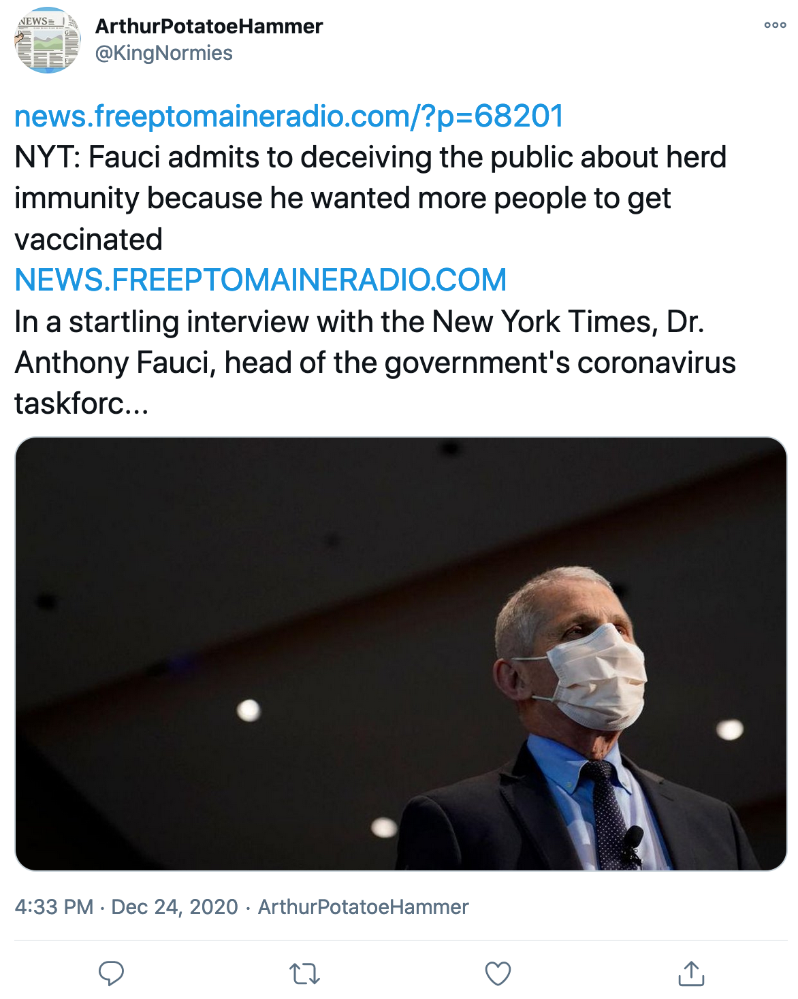 </td>
<td> 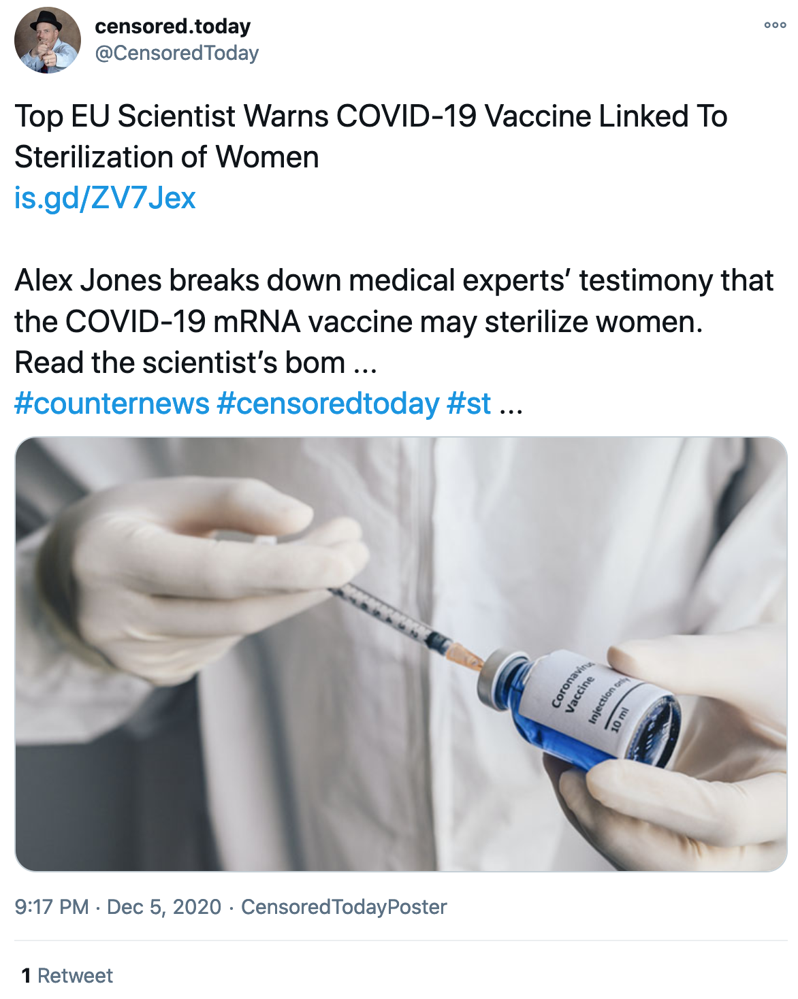 </td>
<td> 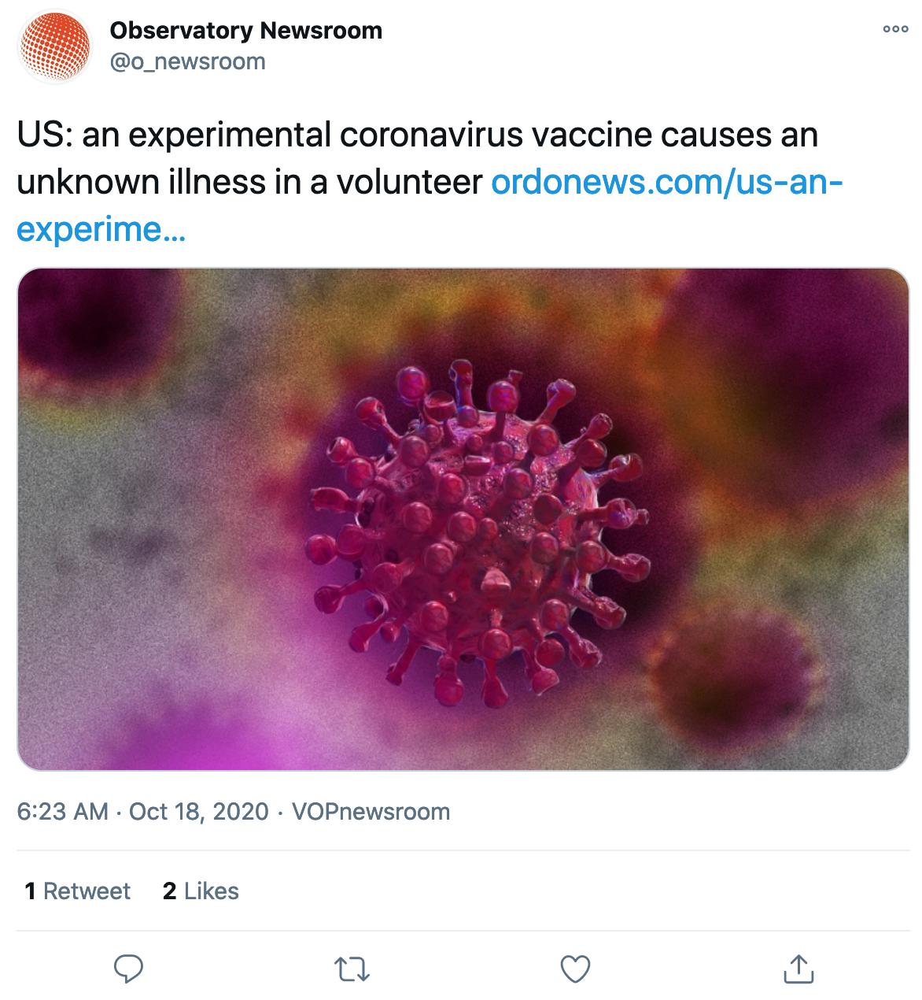 </td>
<td> 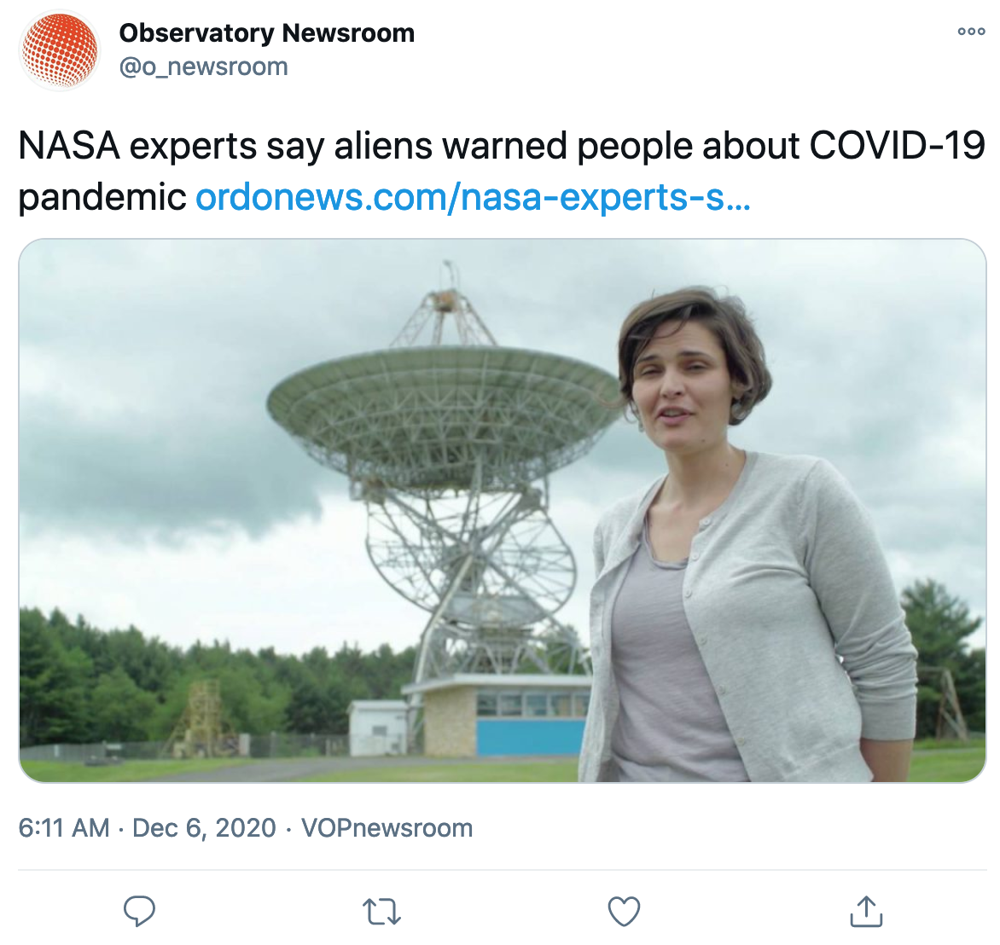 </td>
</tr></table>